# <b> Project Title : Loan Default Prediction : Predicting whether a customer will default on a loan. </b>


Numerous companies from financial indutry often invest considerable resources to improve their predictive models with the aim of having better insights into their customers. Such an interest in model improvement has intensified in recent years mostly because of fast development of machine learning and artificial intelligence. For standard lending institution default predictive model with high performance helps to considerably minimize Credit Loss, resulting in higher revenue and profits. Usually the better predictive model the more efficient is the underwriting policy and collection process. A well-functioning model should distinguish creditworthy customers from those that are credit risks. Often, more-predictive credit-decisioning model can identify a greater number of customers within an institution’s specified risk tolerance, which should expand revenues as well.

**In this project the goal is to increase detection of defaulted loans before the loan is issued/offered by P2P lending company - Lending Club. Peer-to-peer lending differs from traditional financial institutions like banks or commercial lending companies.**

So, Lending Club is a mediator between investors and borrowers, earning money by charging both. The main Lending Club interest is to attract more clients and maintain protfolio size. The motivation of borrowers is clear, they want to find as cheap capital as possible, so they're seeking for the best offer at the market, which is available for them. In case of investors the motivation is obvious as well. Investors look for high ROI (return of investments), but remembering that returns are proportional to risks, we may formalize saying, that investors look for appropriate returns/risks ratio. If investors experience losses it may cause churn rate growth.

The underwriting process for Lending Club looks like this. Borrower applies for the loan, then if he/she meets all the basic requirements - Lending Club using their scoring model assigns client to respective grade. There are 7 grades and 35 sub-grades. Interest rate is dependent on sub-grade. After that, Lending Club gives access to the loan for investors with information about the loan and the borrower (incl. grade and sub-grade) and investors decide whether or not to invest money in this loan. The lower the grade the higher the interest rate, which means, that investors may take higher risks to gain potentially higher returns.

Seeking for default rate reduction we can end up with too restrictive underwriting policy which does not neccessary correlate with higher ROI for investors, because we'll not let investors choose risky loans, which means lower interests. For Lending Club it probably means the loss of investors with high risk appetite and borrowers with weak credit history, or in case of Lending Club those who need higher loan amount.

# **Problem Statement Analysis**
* Loan default occurs when a borrower fails to pay back a debt according to the initial arrangement. In the case of most consumer loans, this means that successive payments have been missed over the course of weeks or months. Fortunately, lenders and loan servicers usually allow a grace period before penalizing the borrower after missing one payment. The period between missing a loan payment and having the loan default is known as delinquency. The delinquency period gives the debtor time to avoid default by contacting their loan servicer or making up missed payments.
* Defaulting on a loan will cause a substantial and lasting drop in the debtor's credit score, as well as extremely high interest rates on any future loan. For loans secured with collateral, defaulting will likely result in the pledged asset being seized by the bank. The most popular types of consumer loans that are backed by collateral are mortgages, auto loans and secured personal loans. For unsecured debts like credit cards and student loans, the consequences of default vary in severity according to the type of loan. In the most extreme cases, debt collection agencies can garnish wages to pay back the outstanding debt.
* The loan is one of the most important products of the banking. All the banks are trying to figure out effective business strategies to persuade customers to apply their loans. However, **there are some customers behave negatively after their application are approved**.

In [ ]:
import pandas as pd
import numpy as np
from numpy import math
import matplotlib.pyplot as plt
plt.style.use("seaborn-whitegrid")
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from matplotlib import rcParams
from matplotlib.cm import rainbow
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

In [ ]:
loan_df = pd.read_csv(r"C:\Users\jatin\Downloads\lending_club_loans (1).csv",skiprows=1,low_memory=False)
loan_df = loan_df.reset_index(level=None, drop=False, inplace=False, col_level=0, col_fill='')
loan_df.dropna(axis = 1, how = 'any', thresh = 10000, inplace = True)
loan_df.dropna(axis = 0, how = 'all', inplace = True)
# loan_df = loan_df.rename(columns=loan_df.iloc[0])
loan_df = loan_df.drop(loan_df.index[0])
pd.set_option('display.max_columns', None)

In [ ]:
loan_df.drop('index',axis=1,inplace=True)
loan_df.head(3)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
1,1077430,1314167.0,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-1999,740.0,744.0,5.0,NaN,3.0,0.0,1687.0,9.4%,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-2013,119.66,Sep-2016,499.0,0.0,0.0,1.0,INDIVIDUAL,0.0,0.0,0.0,0.0,0.0
2,1077175,1313524.0,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-2011,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,735.0,739.0,2.0,NaN,2.0,0.0,2956.0,98.5%,10.0,f,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-2014,649.91,Sep-2016,719.0,715.0,0.0,1.0,INDIVIDUAL,0.0,0.0,0.0,0.0,0.0
3,1076863,1277178.0,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-1996,690.0,694.0,1.0,35.0,10.0,0.0,5598.0,21%,37.0,f,0.0,0.0,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-2015,357.48,Apr-2016,604.0,600.0,0.0,1.0,INDIVIDUAL,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Rows: {} and columns: {}".format(loan_df.shape[0], loan_df.shape[1]))

Rows: 42537 and columns: 59


In [ ]:
loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42537 entries, 1 to 42537
Data columns (total 59 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          42537 non-null  object 
 1   member_id                   42534 non-null  float64
 2   loan_amnt                   42534 non-null  float64
 3   funded_amnt                 42534 non-null  float64
 4   funded_amnt_inv             42534 non-null  float64
 5   term                        42534 non-null  object 
 6   int_rate                    42534 non-null  object 
 7   installment                 42534 non-null  float64
 8   grade                       42534 non-null  object 
 9   sub_grade                   42534 non-null  object 
 10  emp_title                   39909 non-null  object 
 11  emp_length                  41422 non-null  object 
 12  home_ownership              42534 non-null  object 
 13  annual_inc                  425

<AxesSubplot:>

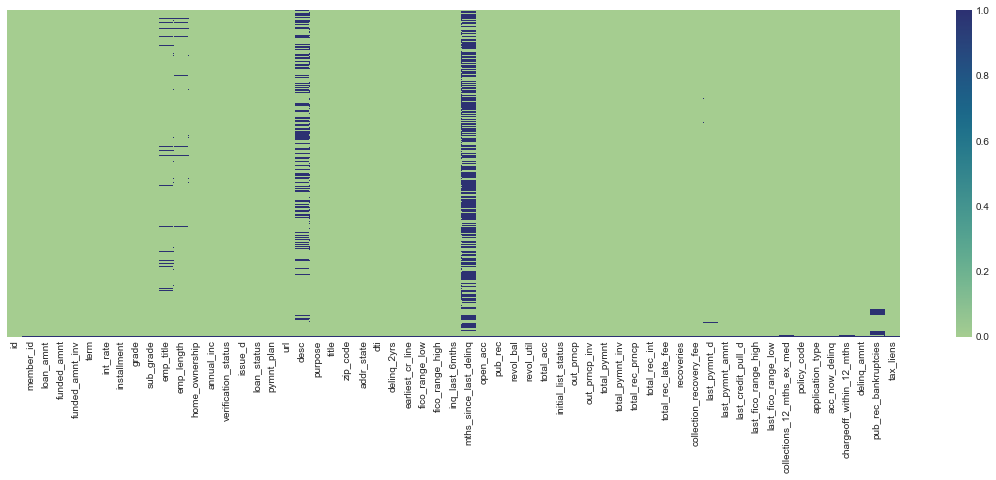

In [ ]:
# Checking Null Values
plt.figure(figsize = (20,6))
sns.heatmap(loan_df.isnull(), yticklabels = False, cmap = 'crest' )

# **Description of every feature in our dataset:**

* id: A unique LC assigned ID for the loan listing.

* member_id:-A unique LC assigned Id for the borrower member.

* loan_amnt:-The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

* funded_amnt:-The total amount committed to that loan at that point in time.

* funded_amnt_inv:-The total amount committed by investors for that loan at that point in time.

* term:-The number of payments on the loan. Values are in months and can be either 36 or 60.

* int_rate:-Interest Rate on the loan

* installment:-The monthly payment owed by the borrower if the loan originates.

* grade:-LC assigned loan grade

* sub_grade:-LC assigned loan subgrade

* emp_title:-The job title supplied by the Borrower when applying for the loan.*

* emp_length:-Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

* home_ownership:-The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

* annual_inc:-The self-reported annual income provided by the borrower during registration.

* verification_status:-Indicates if income was verified by LC, not verified, or if the income source was verified

* issue_d:-The month which the loan was funded

* loan_status:-Current status of the loan

* pymnt_plan:-Indicates if a payment plan has been put in place for the loan

* url:-URL for the LC page with listing data.

* desc:-Loan description provided by the borrower

* purpose:-A category provided by the borrower for the loan request. 

* title:-The loan title provided by the borrower

* zip_code:-The first 3 numbers of the zip code provided by the borrower in the loan application.
* addr_state:-The state provided by the borrower in the loan application
* dti:-A ratio calculated using the borrower’s total monthly debt 
payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

* delinq_2yrs:-The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years

* earliest_cr_line:-The month the borrower's earliest reported credit line was opened

* fico_range_low:-The lower boundary range the borrower’s FICO at loan origination belongs to.

* fico_range_high:-The upper boundary range the borrower’s FICO at loan origination belongs to.

* inq_last_6mths:-The number of inquiries in past 6 months (excluding auto and mortgage inquiries)
* mths_since_last_delinq:-The number of months since the borrower's last delinquency.

* open_acc:-The number of open credit lines in the borrower's credit file.

* pub_rec:-Number of derogatory public records

* revol_bal:-Total credit revolving balance

* revol_util:-Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.

* total_acc:-The total number of credit lines currently in the borrower's credit file

* initial_list_status:-The initial listing status of the loan. Possible values are – W, F

* out_prncp:-Remaining outstanding principal for total amount funded

* out_prncp_inv:-Remaining outstanding principal for portion of total amount funded by investors

* total_pymnt:-Payments received to date for total amount funded

* total_pymnt_inv:-Payments received to date for portion of total amount funded by investors

* total_rec_prncp:-Principal received to date

* total_rec_int:-Interest received to date

* total_rec_late_fee:-Late fees received to date

* recoveries:-post charge off gross recovery

* collection_recovery_fee:-post charge off collection fee

* last_pymnt_d:-Last month payment was received

* last_pymnt_amnt:-Last total payment amount received

* last_credit_pull_d:-The most recent month LC pulled credit for this loan

* last_fico_range_high:-The upper boundary range the borrower’s last FICO pulled belongs to.

* last_fico_range_low:-The lower boundary range the borrower’s last FICO pulled belongs to.

* collections_12_mths_ex_med:-Number of collections in 12 months excluding medical collections

* policy_code:-publicly available policy_code=1

new products not publicly available policy_code=2

* application_type:-Indicates whether the loan is an individual 
application or a joint application with two co-borrowers

* acc_now_delinq:-The number of accounts on which the borrower is now delinquent.

* chargeoff_within_12_mths:-Number of charge-offs within 12 months

* delinq_amnt:-The past-due amount owed for the accounts on which the 
borrower is now delinquent.

* pub_rec_bankruptcies:-Number of public record bankruptcies

* tax_liens:-Number of tax liens


In [ ]:
# Description of our features
loan_df.describe()

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,policy_code,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
count,4.253400e+04,42534.000000,42534.000000,42534.000000,42534.000000,4.253000e+04,42534.000000,42505.000000,42534.000000,42534.000000,42505.000000,15609.000000,42505.000000,42505.000000,4.253400e+04,42505.000000,42534.000000,42534.000000,42534.000000,42534.000000,42534.000000,42534.000000,42534.000000,42534.000000,42534.000000,42534.000000,42534.000000,42534.000000,42389.0,42534.0,42505.000000,42389.0,42505.000000,41169.000000,42429.000000
mean,8.256915e+05,11089.865754,10821.722622,10139.952031,322.626819,6.913762e+04,13.372707,0.152453,713.052029,717.052029,1.081426,35.017618,9.344101,0.058158,1.429788e+04,22.124715,11.849840,11.816169,12005.785436,11298.721090,9664.381006,2239.579453,1.515357,100.309712,13.957066,2612.777488,689.304016,676.381248,0.0,1.0,0.000094,0.0,0.143042,0.045228,0.000024
std,2.795349e+05,7410.966683,7146.942944,7131.726312,208.928237,6.409673e+04,6.726038,0.512412,36.188707,36.188707,1.527473,22.418427,4.496221,0.245716,2.201870e+04,11.592773,125.378024,125.063316,9067.301401,9010.390528,7087.516612,2583.743857,7.827888,718.086992,159.623723,4385.234516,80.203386,119.012554,0.0,0.0,0.009701,0.0,29.359925,0.208740,0.004855
min,7.047300e+04,500.000000,500.000000,0.000000,15.670000,1.896000e+03,0.000000,0.000000,610.000000,614.000000,0.000000,0.000000,1.000000,0.000000,0.000000e+00,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.000000,0.0,0.000000,0.000000,0.000000
25%,6.384762e+05,5200.000000,5000.000000,4950.000000,165.550000,4.000000e+04,8.200000,0.000000,685.000000,689.000000,0.000000,17.000000,6.000000,0.000000,3.634500e+03,13.000000,0.000000,0.000000,5462.748718,4791.407500,4400.000000,657.100000,0.000000,0.000000,0.000000,211.395000,644.000000,640.000000,0.0,1.0,0.000000,0.0,0.000000,0.000000,0.000000
50%,8.241775e+05,9700.000000,9600.000000,8500.000000,277.695000,5.900000e+04,13.470000,0.000000,710.000000,714.000000,1.000000,33.000000,9.000000,0.000000,8.820000e+03,20.000000,0.000000,0.000000,9680.252359,8955.230000,8000.000000,1339.210000,0.000000,0.000000,0.000000,527.930000,699.000000,695.000000,0.0,1.0,0.000000,0.0,0.000000,0.000000,0.000000
75%,1.033938e+06,15000.000000,15000.000000,14000.000000,428.205000,8.250000e+04,18.680000,0.000000,740.000000,744.000000,2.000000,51.000000,12.000000,0.000000,1.725150e+04,29.000000,0.000000,0.000000,16421.873754,15525.310000,13425.000000,2802.950000,0.000000,0.000000,0.000000,3170.275000,744.000000,740.000000,0.0,1.0,0.000000,0.0,0.000000,0.000000,0.000000
max,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,13.000000,825.000000,829.000000,33.000000,120.000000,47.000000,5.000000,1.207359e+06,90.000000,3555.850000,3553.300000,58563.679929,58563.680000,35000.020000,23823.750000,209.000000,29623.350000,7002.190000,36115.200000,850.000000,845.000000,0.0,1.0,1.000000,0.0,6053.000000,2.000000,1.000000


In [ ]:
loan_df.drop(['url','desc'],axis=1, inplace =True)

In [ ]:
# checking loan status
loan_df["loan_status"].value_counts()

Fully Paid                                             33585
Charged Off                                             5653
Does not meet the credit policy. Status:Fully Paid      1988
Does not meet the credit policy. Status:Charged Off      761
Current                                                  513
In Grace Period                                           16
Late (31-120 days)                                        12
Late (16-30 days)                                          5
Default                                                    1
Name: loan_status, dtype: int64

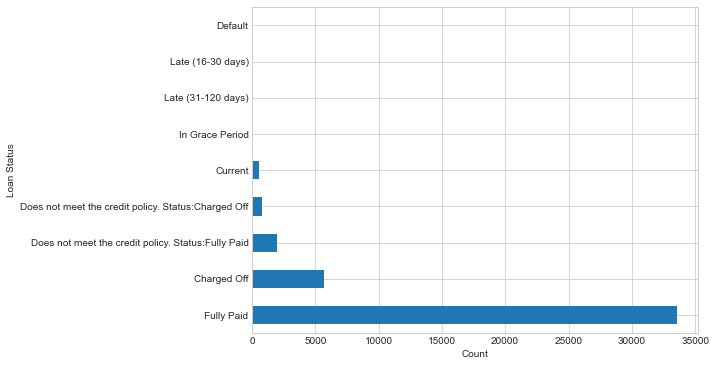

In [ ]:
# Plot Loan Status
plt.figure(figsize= (8,6))
plt.ylabel('Loan Status')
plt.xlabel('Count')
loan_df['loan_status'].value_counts().plot(kind = 'barh', grid = True)
plt.show()

**Fully Paid**->Loan has been fully paid off.

**Charged off**->Loan for which there is no longer a reasonable expectation of further payments.

**Does not meet the credit policy. Status:Fully Paid**--> While the loan was paid off, the loan application today would no longer meet the credit policy and wouldn't be approved on to the marketplace.

**Does not meet the credit policy. Status:charged off**->While the loan was charged off, the loan application today would no longer meet the credit policy and wouldn't be approved on to the marketplace.

Current->Loan is up to date on current payments.,

**In Grace period**->The loan is past due but still in the grace period of 15 days.

**Late(30-120)**->Loan hasn't been paid in 31 to 120 days (late on the current payment).

**Late(16-30)**->Loan hasn't been paid in 16 to 30 days (late on the current payment).

**Default**->Loan is defaulted on and no payment has been made for more than 121 days.


In [ ]:
# number of null values in loan status 
loan_df['loan_status'].isnull().sum()

3

In [ ]:
loan_df=loan_df[loan_df["loan_status"]!='Current']
loan_df.dropna(subset=['loan_status'],inplace=True)
loan_df=loan_df.reset_index()
del loan_df['index']

In [ ]:
# Encoding the loan status variable
dct = {"loan_status":{ "Fully Paid": 0, "Charged Off": 1,'Does not meet the credit policy. Status:Fully Paid':1,
'Does not meet the credit policy. Status:Charged Off':1,'In Grace Period':1,'Late (31-120 days)':1 ,'Late (16-30 days)':1,'Default':1}}
loan_df = loan_df.replace(dct)

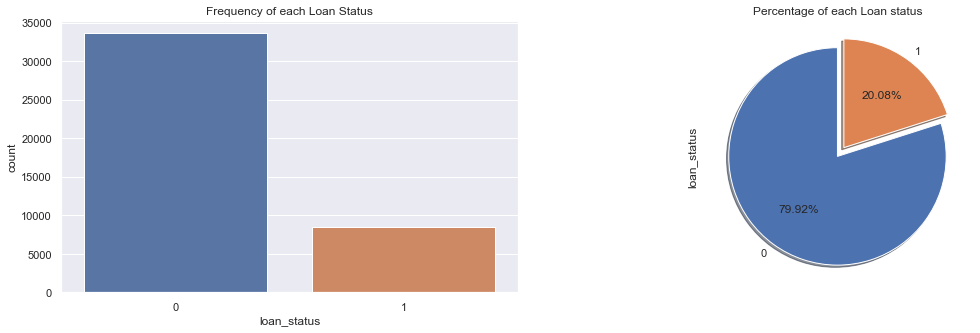

In [ ]:
# Plotting the loan status
sns.set_theme()
fig, axs = plt.subplots(1,2,figsize=(18,5))
sns.countplot(x='loan_status',data=loan_df,ax=axs[0])
axs[0].set_title("Frequency of each Loan Status")
loan_df.loan_status.value_counts().plot(x=None,y=None, kind='pie', ax=axs[1],shadow =True,explode = (0, 0.1,),autopct='%1.2f%%',startangle=90 )
axs[1].set_title("Percentage of each Loan status")
plt.show()

This clearly is a case of an imbalanced class problem where the value of class is far less than the other. There are cost function based approaches and sampling based approaches for handling this kind of problem which we will use later so that our model doesn't exhibit high bias while trying to predict if a loan will default or not.

A common thing to predict in datasets like these are if a new loan will get default or not. I'll be keeping loans with default status as my target variable.
**Here, We have finalize loan status as our target variable which has now 20 % are defaulters for the loan payment.**

# **Exploratory Data Analysis(EDA)**

In [ ]:
descr_df = pd.read_csv(r"C:\Users\jatin\Downloads\LCDataDictionary.csv")

#Droping null value from dataframe[Description DataFrame]
descr_df.dropna(inplace=True)

In [ ]:
descr_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115 entries, 0 to 114
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   LoanStatNew  115 non-null    object
 1   Description  115 non-null    object
dtypes: object(2)
memory usage: 2.7+ KB


### **Let's check % miss Value for all feature for our Loan df**

In [ ]:
def missing_values(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        return mis_val_table_ren_columns

In [ ]:
# Missing values statistics
miss_values = missing_values(loan_df)
miss_values.head()

Dataframe has 57 columns.
There are 20 columns that have missing values.


,Missing Values,% of Total Values
mths_since_last_delinq,26568,63.2
emp_title,2588,6.2
pub_rec_bankruptcies,1365,3.2
emp_length,1093,2.6
chargeoff_within_12_mths,145,0.3


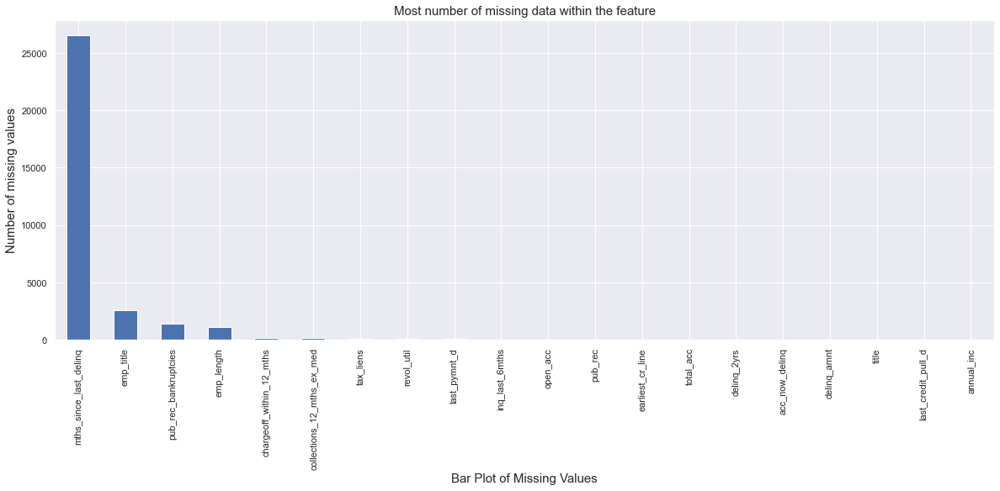

In [ ]:
# Checking distribution of null values
plt.figure(figsize=(20,7))
missing= loan_df.isnull().sum()
missing= missing[missing > 0]
missing.sort_values(ascending= False, inplace=True)
plt.xlabel("Bar Plot of Missing Values", fontsize=15)
plt.ylabel("Number of missing values", fontsize=15)
plt.title("Most number of missing data within the feature", fontsize=15)
missing[:80].plot(kind="bar")
plt.show()

The percentage of missing data in many columns are far more than we can work with. So, we'll have to remove columns having a certain percentage of data less than the total data later on.

### **Droping Column which has missing value more than 90%**

In [ ]:
columns = [column for column in loan_df.count() < 42022*0.10]
loan_df.drop(loan_df.columns[columns], axis=1, inplace=True)

In [ ]:
# Missing values statistics
miss_values = missing_values(loan_df)
miss_values.head()
#Now our dataframe has only 21 features which has missing value

Dataframe has 57 columns.
There are 20 columns that have missing values.


,Missing Values,% of Total Values
mths_since_last_delinq,26568,63.2
emp_title,2588,6.2
pub_rec_bankruptcies,1365,3.2
emp_length,1093,2.6
chargeoff_within_12_mths,145,0.3


### **Remove features with only One Unique Value.**

Let’s see **are there any features that contain only one unique value?** If yes, We can remove them because that feature is redundant for all the record.

In [ ]:
redundant_columns=list(loan_df.loc[:,loan_df.apply(pd.Series.nunique) == 1].columns)
len(redundant_columns)

5

In [ ]:
loan_df = loan_df.loc[:,loan_df.apply(pd.Series.nunique) != 1]

In [ ]:
# Missing values statistics
miss_values = missing_values(loan_df)

Dataframe has 52 columns.
There are 18 columns that have missing values.


## **Numerical features:**

In [ ]:
numeric_ls=list(loan_df.describe().columns.to_list())
loan_df[numeric_ls].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42021 entries, 0 to 42020
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   member_id                42021 non-null  float64
 1   loan_amnt                42021 non-null  float64
 2   funded_amnt              42021 non-null  float64
 3   funded_amnt_inv          42021 non-null  float64
 4   installment              42021 non-null  float64
 5   annual_inc               42017 non-null  float64
 6   loan_status              42021 non-null  int64  
 7   dti                      42021 non-null  float64
 8   delinq_2yrs              41992 non-null  float64
 9   fico_range_low           42021 non-null  float64
 10  fico_range_high          42021 non-null  float64
 11  inq_last_6mths           41992 non-null  float64
 12  mths_since_last_delinq   15453 non-null  float64
 13  open_acc                 41992 non-null  float64
 14  pub_rec               

In [ ]:
loan_df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,last_fico_range_high,last_fico_range_low,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077430,1314167.0,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,1,n,car,bike,309xx,GA,1.00,0.0,Apr-1999,740.0,744.0,5.0,NaN,3.0,0.0,1687.0,9.4%,4.0,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-2013,119.66,Sep-2016,499.0,0.0,0.0,0.0,0.0,0.0
1,1077175,1313524.0,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-2011,0,n,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,735.0,739.0,2.0,NaN,2.0,0.0,2956.0,98.5%,10.0,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-2014,649.91,Sep-2016,719.0,715.0,0.0,0.0,0.0,0.0
2,1076863,1277178.0,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,0,n,other,personel,917xx,CA,20.00,0.0,Feb-1996,690.0,694.0,1.0,35.0,10.0,0.0,5598.0,21%,37.0,0.0,0.0,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-2015,357.48,Apr-2016,604.0,600.0,0.0,0.0,0.0,0.0
3,1075269,1311441.0,5000.0,5000.0,5000.0,36 months,7.90%,156.46,A,A4,Veolia Transportaton,3 years,RENT,36000.0,Source Verified,Dec-2011,0,n,wedding,My wedding loan I promise to pay back,852xx,AZ,11.20,0.0,Nov-2004,730.0,734.0,3.0,NaN,9.0,0.0,7963.0,28.3%,12.0,0.0,0.0,5632.210000,5632.21,5000.00,632.21,0.00,0.00,0.00,Jan-2015,161.03,Jan-2016,679.0,675.0,0.0,0.0,0.0,0.0
4,1069639,1304742.0,7000.0,7000.0,7000.0,60 months,15.96%,170.08,C,C5,Southern Star Photography,8 years,RENT,47004.0,Not Verified,Dec-2011,0,n,debt_consolidation,Loan,280xx,NC,23.51,0.0,Jul-2005,690.0,694.0,1.0,NaN,7.0,0.0,17726.0,85.6%,11.0,0.0,0.0,10137.840008,10137.84,7000.00,3137.84,0.00,0.00,0.00,May-2016,1313.76,Sep-2016,654.0,650.0,0.0,0.0,0.0,0.0


In [ ]:
# No duplicated records
loan_df.duplicated().sum()

0

In [ ]:
loan_df.drop(['id','member_id'],axis=1,inplace=True)

In [ ]:
# Dividing into numerical and categorical columns
numerical_cols = loan_df.describe().columns
object_type_cols=[var for var in loan_df.columns if var not in numerical_cols]
object_type_cols

['term',
 'int_rate',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'pymnt_plan',
 'purpose',
 'title',
 'zip_code',
 'addr_state',
 'earliest_cr_line',
 'revol_util',
 'last_pymnt_d',
 'last_credit_pull_d']

In [ ]:
def clean_features(feature, special_char):
    entry_list=[]
    for i in range(len(loan_df)):
        entry_list.append(float(loan_df.loc[i,feature].split(special_char)[0]))
    return entry_list

In [ ]:
term_list = clean_features('term','months')
interest_rate=clean_features('int_rate','%')

# Modifying the features of our dataset
loan_df['term_list']=term_list
loan_df['interest_rate']=interest_rate

# Dropping the features
loan_df.drop(['term','int_rate'],axis=1, inplace=True)

In [ ]:
loan_df.head(3)

,loan_amnt,funded_amnt,funded_amnt_inv,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,last_fico_range_high,last_fico_range_low,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies,tax_liens,term_list,interest_rate
0,2500.0,2500.0,2500.0,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,1,n,car,bike,309xx,GA,1.00,0.0,Apr-1999,740.0,744.0,5.0,NaN,3.0,0.0,1687.0,9.4%,4.0,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-2013,119.66,Sep-2016,499.0,0.0,0.0,0.0,0.0,0.0,60.0,15.27
1,2400.0,2400.0,2400.0,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-2011,0,n,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,735.0,739.0,2.0,NaN,2.0,0.0,2956.0,98.5%,10.0,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-2014,649.91,Sep-2016,719.0,715.0,0.0,0.0,0.0,0.0,36.0,15.96
2,10000.0,10000.0,10000.0,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,0,n,other,personel,917xx,CA,20.00,0.0,Feb-1996,690.0,694.0,1.0,35.0,10.0,0.0,5598.0,21%,37.0,0.0,0.0,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-2015,357.48,Apr-2016,604.0,600.0,0.0,0.0,0.0,0.0,36.0,13.49


**We can drop below features because it's not provided by customer and they can be future leak.**
* **funded_amnt:-** The total amount committed to that loan at that point in time.
* **funded_amnt_inv:-** The total amount committed by investors for that loan at that point in time.

In [ ]:
# Dropping the features funded amount and the funded amount invested:
loan_df.drop(['funded_amnt','funded_amnt_inv'],axis=1,inplace=True)

In [ ]:
loan_df.head(3)

,loan_amnt,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,last_fico_range_high,last_fico_range_low,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies,tax_liens,term_list,interest_rate
0,2500.0,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,1,n,car,bike,309xx,GA,1.00,0.0,Apr-1999,740.0,744.0,5.0,NaN,3.0,0.0,1687.0,9.4%,4.0,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-2013,119.66,Sep-2016,499.0,0.0,0.0,0.0,0.0,0.0,60.0,15.27
1,2400.0,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-2011,0,n,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,735.0,739.0,2.0,NaN,2.0,0.0,2956.0,98.5%,10.0,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-2014,649.91,Sep-2016,719.0,715.0,0.0,0.0,0.0,0.0,36.0,15.96
2,10000.0,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,0,n,other,personel,917xx,CA,20.00,0.0,Feb-1996,690.0,694.0,1.0,35.0,10.0,0.0,5598.0,21%,37.0,0.0,0.0,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-2015,357.48,Apr-2016,604.0,600.0,0.0,0.0,0.0,0.0,36.0,13.49


In [ ]:
numerical_cols=loan_df.describe().columns

In [ ]:
len(numerical_cols)

32

### **Some features that need further analysis on:**
* tax_liens
* acc_now_delinq
* delinq_amt
* collection_recovery fee
* recoveries

In [ ]:
red_cols = [i for i in loan_df.describe().columns if loan_df[i].nunique()<14 and i != 'loan_status']
red_cols

['delinq_2yrs',
 'pub_rec',
 'acc_now_delinq',
 'delinq_amnt',
 'pub_rec_bankruptcies',
 'tax_liens',
 'term_list']

### **Below columns are the leaks data from the future.so we should  drop it from our dataset.**
* **total_pymnt:-** Payments received to date for total amount funded.
* **total_pymnt_inv:-** Payments received to date for portion of total amount funded by investors.
* **total_rec_prncp:-** Principal received to date.
* **total_rec_int:-** Interest received to date.
* **total_rec_late_fee:-** Late fees received to date.
* **recoveries:-** post charge off gross recovery.
* **collection_recovery_fee:-** post charge off collection fee.
* **last_pymnt_d:-** Last month payment was received.
* **last_pymnt_amnt:-** Last total payment amount received.

<AxesSubplot:xlabel='tax_liens', ylabel='count'>

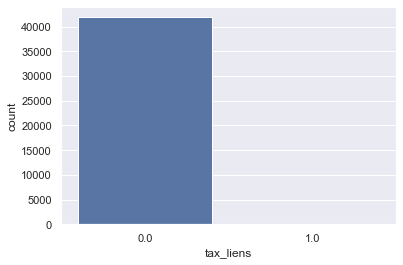

In [ ]:
# Countplot of tax_liens
sns.countplot(x='tax_liens',data=loan_df)

In [ ]:
# Storing all the redundant columns
redundant_cols= ['tax_liens', 'acc_now_delinq', 'delinq_amnt', 'total_pymnt', 'total_pymnt_inv', 
                 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 
                 'collection_recovery_fee', 'out_prncp', 'out_prncp_inv', 'last_pymnt_amnt']

In [ ]:
# Updating numerical columns
numerical_cols = list(set(numerical_cols) - set(redundant_cols))
print(numerical_cols)

['fico_range_low', 'revol_bal', 'installment', 'fico_range_high', 'loan_amnt', 'open_acc', 'last_fico_range_low', 'last_fico_range_high', 'delinq_2yrs', 'dti', 'pub_rec_bankruptcies', 'pub_rec', 'annual_inc', 'total_acc', 'inq_last_6mths', 'interest_rate', 'loan_status', 'term_list', 'mths_since_last_delinq']


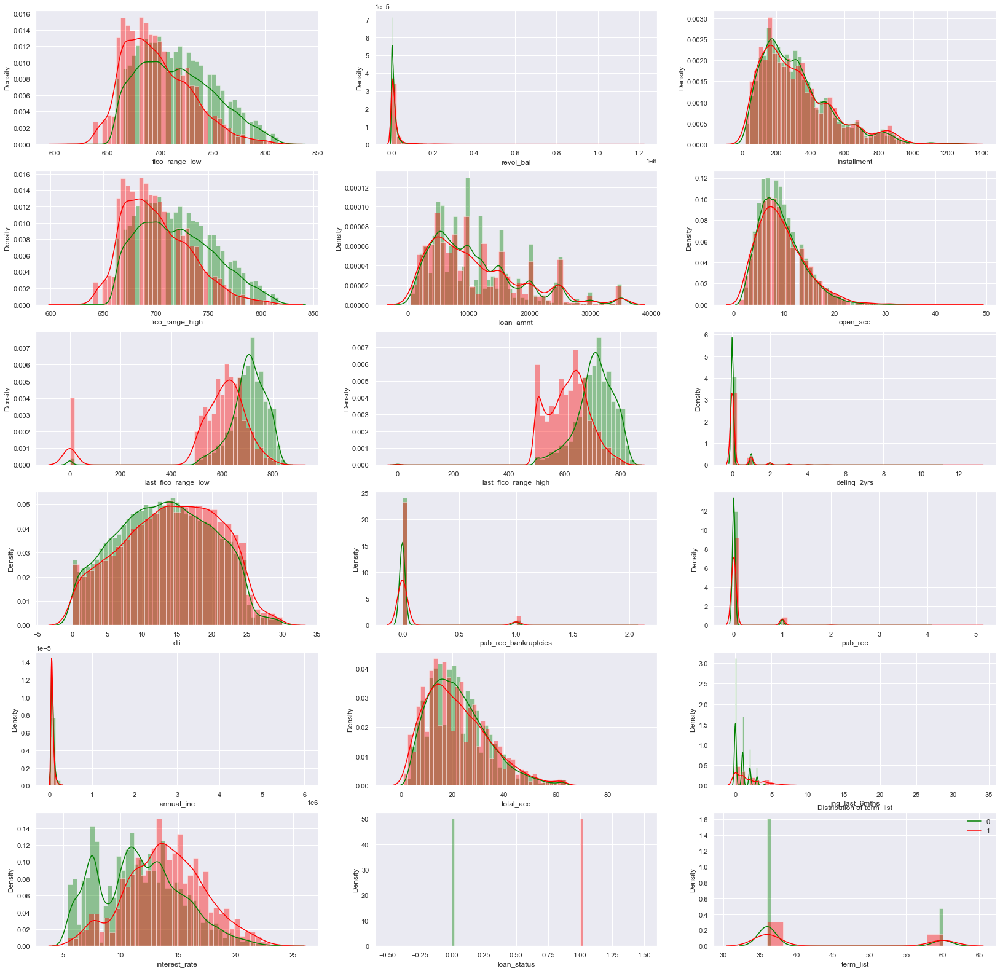

In [ ]:
# Checking the histogram of all the numeical features
fig, ax = plt.subplots(6, 3, figsize=(28, 28))
for variable, subplot in zip(numerical_cols[:-1], ax.flatten()):
    sns.distplot(loan_df[variable][loan_df['loan_status'] == 0], ax =subplot, color = 'green')
    sns.distplot(loan_df[variable][loan_df['loan_status'] == 1], ax= subplot, color = 'red')
    plt.title("Distribution of {}".format(variable))
    plt.legend(['0','1'])

**Conclusions from the distribution plot:**
The density of interest rates follow kind of a Normal distribution with more density on interest rates between 12%-18%.
So we can see that annaul_inc is a skewd distribution so wee ned impliment outliar treatment on this.
we can see that intrate, installment and funded amount follow similar type distribution.

In [ ]:
loan_df[numerical_cols].head(3)

,fico_range_low,revol_bal,installment,fico_range_high,loan_amnt,open_acc,last_fico_range_low,last_fico_range_high,delinq_2yrs,dti,pub_rec_bankruptcies,pub_rec,annual_inc,total_acc,inq_last_6mths,interest_rate,loan_status,term_list,mths_since_last_delinq
0,740.0,1687.0,59.83,744.0,2500.0,3.0,0.0,499.0,0.0,1.00,0.0,0.0,30000.0,4.0,5.0,15.27,1,60.0,NaN
1,735.0,2956.0,84.33,739.0,2400.0,2.0,715.0,719.0,0.0,8.72,0.0,0.0,12252.0,10.0,2.0,15.96,0,36.0,NaN
2,690.0,5598.0,339.31,694.0,10000.0,10.0,600.0,604.0,0.0,20.00,0.0,0.0,49200.0,37.0,1.0,13.49,0,36.0,35.0


<AxesSubplot:>

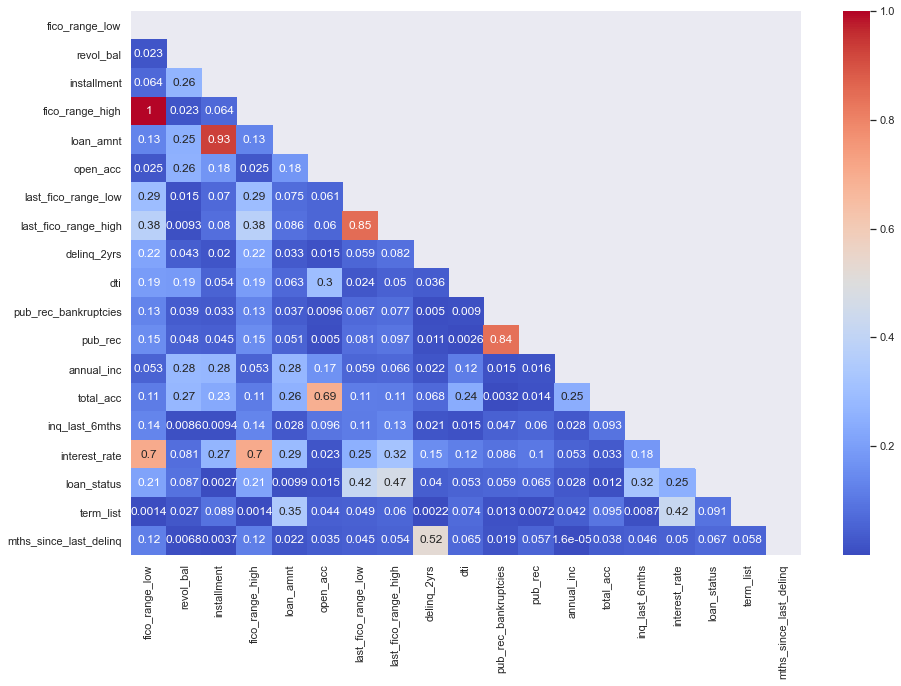

In [ ]:
# Checking correlation
plt.figure(figsize=(15,10))
cor=loan_df[numerical_cols].corr().abs()
mask = np.triu(np.ones_like(cor, dtype=bool))
sns.heatmap(cor,mask=mask,annot=True,cmap='coolwarm')

In [ ]:
# Averaging the fico ranges as they are highly correlated
loan_df['fico_range_avg']=(0.5*loan_df['fico_range_high']+ 0.5*loan_df['fico_range_low'])

# Appending the redundant cols
redundant_cols.extend(['fico_range_high','fico_range_low'])
numerical_cols=list(set(numerical_cols)-set(redundant_cols))

### **Categorical Columns:**

In [ ]:
# Separating categorical data
categorical_cols= list(set(loan_df.columns.to_list())-set(loan_df.describe().columns.to_list()))

In [ ]:
# Categorical features
print(categorical_cols)
print("Number of categorical features are: {}".format(len(categorical_cols)))

['pymnt_plan', 'zip_code', 'sub_grade', 'purpose', 'earliest_cr_line', 'grade', 'emp_length', 'issue_d', 'emp_title', 'title', 'addr_state', 'last_pymnt_d', 'home_ownership', 'verification_status', 'last_credit_pull_d', 'revol_util']
Number of categorical features are: 16


<AxesSubplot:>

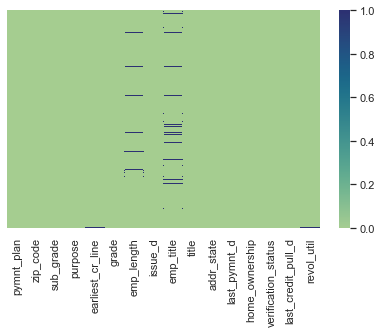

In [ ]:
plt.figure(figsize=(7,4))
sns.heatmap(loan_df[categorical_cols].isnull(), yticklabels=False, cmap='crest')

In [ ]:
# Columns with missing values
loan_df[categorical_cols].isnull().sum()

pymnt_plan                0
zip_code                  0
sub_grade                 0
purpose                   0
earliest_cr_line         29
grade                     0
emp_length             1093
issue_d                   0
emp_title              2588
title                    13
addr_state                0
last_pymnt_d             83
home_ownership            0
verification_status       0
last_credit_pull_d        4
revol_util               90
dtype: int64

In [ ]:
categorical_cols

['pymnt_plan',
 'zip_code',
 'sub_grade',
 'purpose',
 'earliest_cr_line',
 'grade',
 'emp_length',
 'issue_d',
 'emp_title',
 'title',
 'addr_state',
 'last_pymnt_d',
 'home_ownership',
 'verification_status',
 'last_credit_pull_d',
 'revol_util']

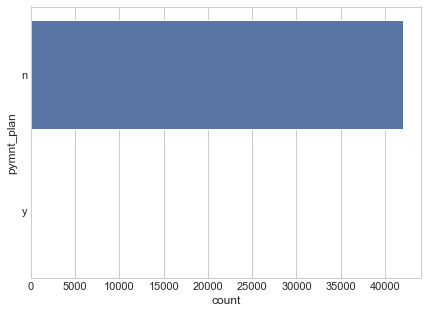

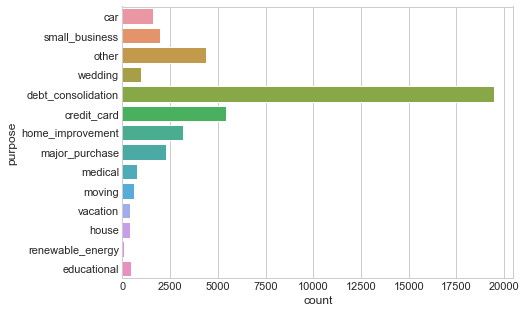

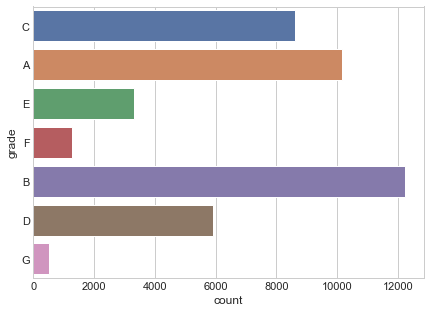

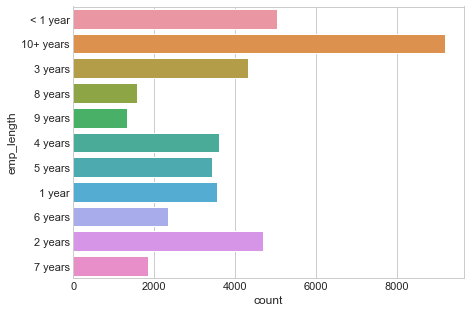

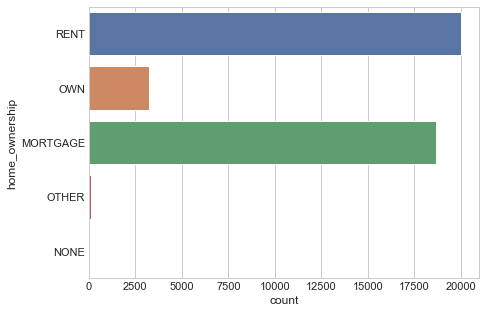

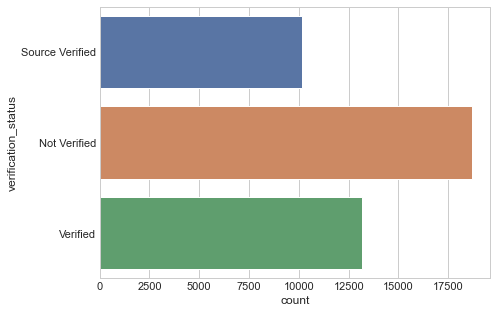

In [ ]:
# Plotting a countplot to check the number of clients corresponding to each feature
plt.style.use('seaborn-whitegrid')
for column in categorical_cols:
    if loan_df[column].nunique() < 25:
        plt.figure(figsize=(7,5)) 
        sns.countplot(y=column,data=loan_df[categorical_cols])
        #plt.legend()
        plt.show()

In [ ]:
# leak data from future.
redundant_cols.extend(['last_pymnt_d','issue_d'])
# All values are diffrent for these columns there is no pattern or any thing intutive
redundant_cols.extend(['title','emp_title','pymnt_plan'])

In [ ]:
redundant_cols

['tax_liens',
 'acc_now_delinq',
 'delinq_amnt',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'out_prncp',
 'out_prncp_inv',
 'last_pymnt_amnt',
 'fico_range_high',
 'fico_range_low',
 'last_pymnt_d',
 'issue_d',
 'title',
 'emp_title',
 'pymnt_plan']

In [ ]:
# Changing object type of emp_length
loan_df['emp_length'].replace(to_replace='[^0-9]+', value='', inplace=True, regex=True)
loan_df['emp_length']=loan_df['emp_length'].astype(float)

### **Dealing with Date and Time columns:**

In [ ]:
#As it's an object type we can take only year and month feature from it
loan_df['earliest_cr_line_month'] = pd.to_datetime(loan_df['earliest_cr_line'].fillna('2001-08-01')).apply(lambda x: int(x.strftime('%m')))
loan_df['earliest_cr_line_year'] = pd.to_datetime(loan_df['earliest_cr_line'].fillna('2001-08-01')).apply(lambda x: int(x.strftime('%Y')))
redundant_columns.append('earliest_cr_line')

In [ ]:
#As it's an object type we can take only year and month feature from it
loan_df['earliest_cr_line_month'] = pd.to_datetime(loan_df['earliest_cr_line'].fillna('2001-08-01')).apply(lambda x: int(x.strftime('%m')))
loan_df['earliest_cr_line_year'] = pd.to_datetime(loan_df['earliest_cr_line'].fillna('2001-08-01')).apply(lambda x: int(x.strftime('%Y')))
redundant_cols.append('earliest_cr_line')

In [ ]:
loan_df.head()

,loan_amnt,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,last_fico_range_high,last_fico_range_low,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies,tax_liens,term_list,interest_rate,fico_range_avg,earliest_cr_line_month,earliest_cr_line_year
0,2500.0,59.83,C,C4,Ryder,1.0,RENT,30000.0,Source Verified,Dec-2011,1,n,car,bike,309xx,GA,1.00,0.0,Apr-1999,740.0,744.0,5.0,NaN,3.0,0.0,1687.0,9.4%,4.0,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-2013,119.66,Sep-2016,499.0,0.0,0.0,0.0,0.0,0.0,60.0,15.27,742.0,4,1999
1,2400.0,84.33,C,C5,NaN,10.0,RENT,12252.0,Not Verified,Dec-2011,0,n,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,735.0,739.0,2.0,NaN,2.0,0.0,2956.0,98.5%,10.0,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-2014,649.91,Sep-2016,719.0,715.0,0.0,0.0,0.0,0.0,36.0,15.96,737.0,11,2001
2,10000.0,339.31,C,C1,AIR RESOURCES BOARD,10.0,RENT,49200.0,Source Verified,Dec-2011,0,n,other,personel,917xx,CA,20.00,0.0,Feb-1996,690.0,694.0,1.0,35.0,10.0,0.0,5598.0,21%,37.0,0.0,0.0,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-2015,357.48,Apr-2016,604.0,600.0,0.0,0.0,0.0,0.0,36.0,13.49,692.0,2,1996
3,5000.0,156.46,A,A4,Veolia Transportaton,3.0,RENT,36000.0,Source Verified,Dec-2011,0,n,wedding,My wedding loan I promise to pay back,852xx,AZ,11.20,0.0,Nov-2004,730.0,734.0,3.0,NaN,9.0,0.0,7963.0,28.3%,12.0,0.0,0.0,5632.210000,5632.21,5000.00,632.21,0.00,0.00,0.00,Jan-2015,161.03,Jan-2016,679.0,675.0,0.0,0.0,0.0,0.0,36.0,7.90,732.0,11,2004
4,7000.0,170.08,C,C5,Southern Star Photography,8.0,RENT,47004.0,Not Verified,Dec-2011,0,n,debt_consolidation,Loan,280xx,NC,23.51,0.0,Jul-2005,690.0,694.0,1.0,NaN,7.0,0.0,17726.0,85.6%,11.0,0.0,0.0,10137.840008,10137.84,7000.00,3137.84,0.00,0.00,0.00,May-2016,1313.76,Sep-2016,654.0,650.0,0.0,0.0,0.0,0.0,60.0,15.96,692.0,7,2005


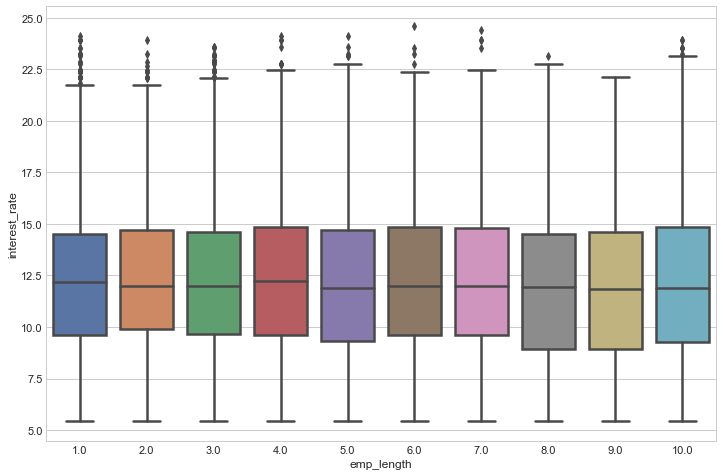

In [ ]:
# Boxplot between employee length and rate of interest
plt.figure(figsize = (12,8))
ax = sns.boxplot(x="emp_length" ,y= "interest_rate", data=loan_df, linewidth=2.5)

**Conclusion:**
The employee length does'nt seem to have a huge impact corresponding to the interest rate as they are almost the same 

<AxesSubplot:xlabel='earliest_cr_line_month', ylabel='count'>

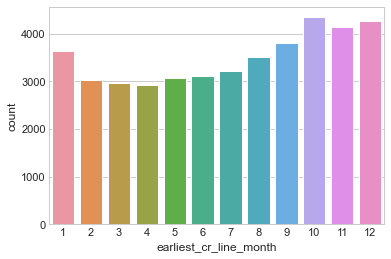

In [ ]:
# Countplot for cr_line month 
sns.countplot(x='earliest_cr_line_month',data=loan_df)

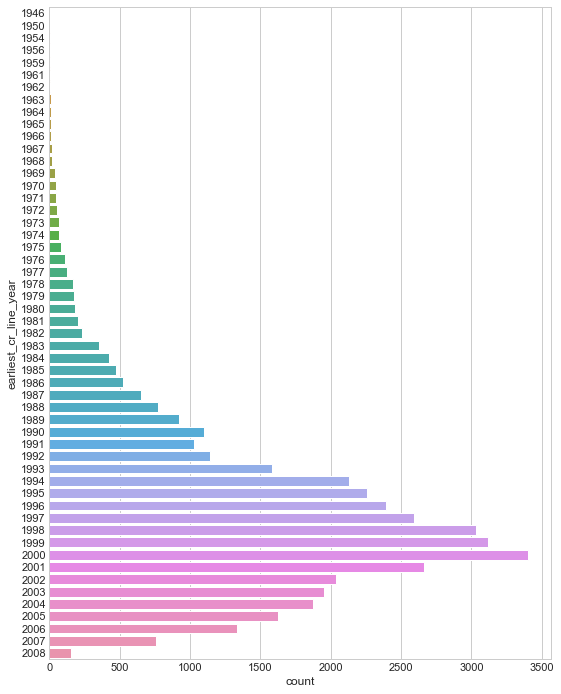

In [ ]:
plt.figure(figsize=(9,12))
g=sns.countplot(y='earliest_cr_line_year',data=loan_df)

**Conclusion:**
Our records have huge counts in the year range starting from 1990 till the year 2000, after which the counts kept on decreasing with the lowest being in the year 2008

In [ ]:
#As it's an object type we can take only year and month feature from it
loan_df['last_credit_pull_d_month'] = pd.to_datetime(loan_df['last_credit_pull_d'].fillna('2016-09-01')).apply(lambda x: int(x.strftime('%m')))
loan_df['last_credit_pull_d_year'] = pd.to_datetime(loan_df['last_credit_pull_d'].fillna('2016-09-01')).apply(lambda x: int(x.strftime('%Y')))
redundant_cols.append('last_credit_pull_d')

<AxesSubplot:xlabel='last_credit_pull_d_month', ylabel='count'>

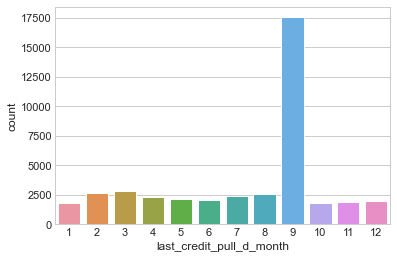

In [ ]:
sns.countplot(x='last_credit_pull_d_month',data=loan_df)

In [ ]:
# label-encode
label_encod=['purpose','zip_code']
one_hot_coding=['home_ownership']
redundant_cols.append('verification_status')

In [ ]:
label_encod.append('grade')
label_encod.append('sub_grade')
label_encod.append('addr_state')

### **Revolving balance**
In credit card terms, a revolving balance is the portion of credit card spending that goes unpaid at the end of a billing cycle. The amount can vary, going up or down depending on the amount borrowed and the amount repaid.

In [ ]:
# Updating our features
loan_df['revol_util'] = loan_df['revol_util'].str.replace('%', '')
loan_df['revol_util'] = loan_df['revol_util'].astype(float)

In [ ]:
# Our features in redundant cols
redundant_cols

['tax_liens',
 'acc_now_delinq',
 'delinq_amnt',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'out_prncp',
 'out_prncp_inv',
 'last_pymnt_amnt',
 'fico_range_high',
 'fico_range_low',
 'last_pymnt_d',
 'issue_d',
 'title',
 'emp_title',
 'pymnt_plan',
 'earliest_cr_line',
 'last_credit_pull_d',
 'verification_status']

In [ ]:
# dropping all the features in redundant cols
loan_df.drop(redundant_cols, axis=1, inplace=True)

In [ ]:
loan_df.head()

,loan_amnt,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,pub_rec_bankruptcies,term_list,interest_rate,fico_range_avg,earliest_cr_line_month,earliest_cr_line_year,last_credit_pull_d_month,last_credit_pull_d_year
0,2500.0,59.83,C,C4,1.0,RENT,30000.0,1,car,309xx,GA,1.00,0.0,5.0,NaN,3.0,0.0,1687.0,9.4,4.0,499.0,0.0,0.0,60.0,15.27,742.0,4,1999,9,2016
1,2400.0,84.33,C,C5,10.0,RENT,12252.0,0,small_business,606xx,IL,8.72,0.0,2.0,NaN,2.0,0.0,2956.0,98.5,10.0,719.0,715.0,0.0,36.0,15.96,737.0,11,2001,9,2016
2,10000.0,339.31,C,C1,10.0,RENT,49200.0,0,other,917xx,CA,20.00,0.0,1.0,35.0,10.0,0.0,5598.0,21.0,37.0,604.0,600.0,0.0,36.0,13.49,692.0,2,1996,4,2016
3,5000.0,156.46,A,A4,3.0,RENT,36000.0,0,wedding,852xx,AZ,11.20,0.0,3.0,NaN,9.0,0.0,7963.0,28.3,12.0,679.0,675.0,0.0,36.0,7.90,732.0,11,2004,1,2016
4,7000.0,170.08,C,C5,8.0,RENT,47004.0,0,debt_consolidation,280xx,NC,23.51,0.0,1.0,NaN,7.0,0.0,17726.0,85.6,11.0,654.0,650.0,0.0,60.0,15.96,692.0,7,2005,9,2016


### **Label Encoding:**

In [ ]:
# features we need to label encode
label_encod

['purpose', 'zip_code', 'grade', 'sub_grade', 'addr_state']

In [ ]:
from sklearn.preprocessing import LabelEncoder
# label_encoder object knows how to understand word labels. 
label_encoder = LabelEncoder()
# Encode labels in column 'grade'
loan_df[label_encod] =loan_df[label_encod].apply(LabelEncoder().fit_transform)

In [ ]:
loan_df[label_encod].head(5)

,purpose,zip_code,grade,sub_grade,addr_state
0,0,280,2,13,10
1,11,512,2,14,14
2,9,763,2,10,4
3,13,720,0,3,3
4,2,251,2,14,27


### **One Hot encoding:**

In [ ]:
#Encoding the purpose features
#nominal_columns = ["purpose"]
dummy_df = pd.get_dummies(loan_df[one_hot_coding])
loan_df = pd.concat([loan_df, dummy_df], axis=1)
loan_df = loan_df.drop(one_hot_coding, axis=1)

In [ ]:
loan_df.head()

,loan_amnt,installment,grade,sub_grade,emp_length,annual_inc,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,pub_rec_bankruptcies,term_list,interest_rate,fico_range_avg,earliest_cr_line_month,earliest_cr_line_year,last_credit_pull_d_month,last_credit_pull_d_year,home_ownership_MORTGAGE,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT
0,2500.0,59.83,2,13,1.0,30000.0,1,0,280,10,1.00,0.0,5.0,NaN,3.0,0.0,1687.0,9.4,4.0,499.0,0.0,0.0,60.0,15.27,742.0,4,1999,9,2016,0,0,0,0,1
1,2400.0,84.33,2,14,10.0,12252.0,0,11,512,14,8.72,0.0,2.0,NaN,2.0,0.0,2956.0,98.5,10.0,719.0,715.0,0.0,36.0,15.96,737.0,11,2001,9,2016,0,0,0,0,1
2,10000.0,339.31,2,10,10.0,49200.0,0,9,763,4,20.00,0.0,1.0,35.0,10.0,0.0,5598.0,21.0,37.0,604.0,600.0,0.0,36.0,13.49,692.0,2,1996,4,2016,0,0,0,0,1
3,5000.0,156.46,0,3,3.0,36000.0,0,13,720,3,11.20,0.0,3.0,NaN,9.0,0.0,7963.0,28.3,12.0,679.0,675.0,0.0,36.0,7.90,732.0,11,2004,1,2016,0,0,0,0,1
4,7000.0,170.08,2,14,8.0,47004.0,0,2,251,27,23.51,0.0,1.0,NaN,7.0,0.0,17726.0,85.6,11.0,654.0,650.0,0.0,60.0,15.96,692.0,7,2005,9,2016,0,0,0,0,1


In [ ]:
# Updating redundant columns
redundant_cols.append('home_ownership_NONE')

In [ ]:
loan_df.shape

(42021, 34)

<AxesSubplot:>

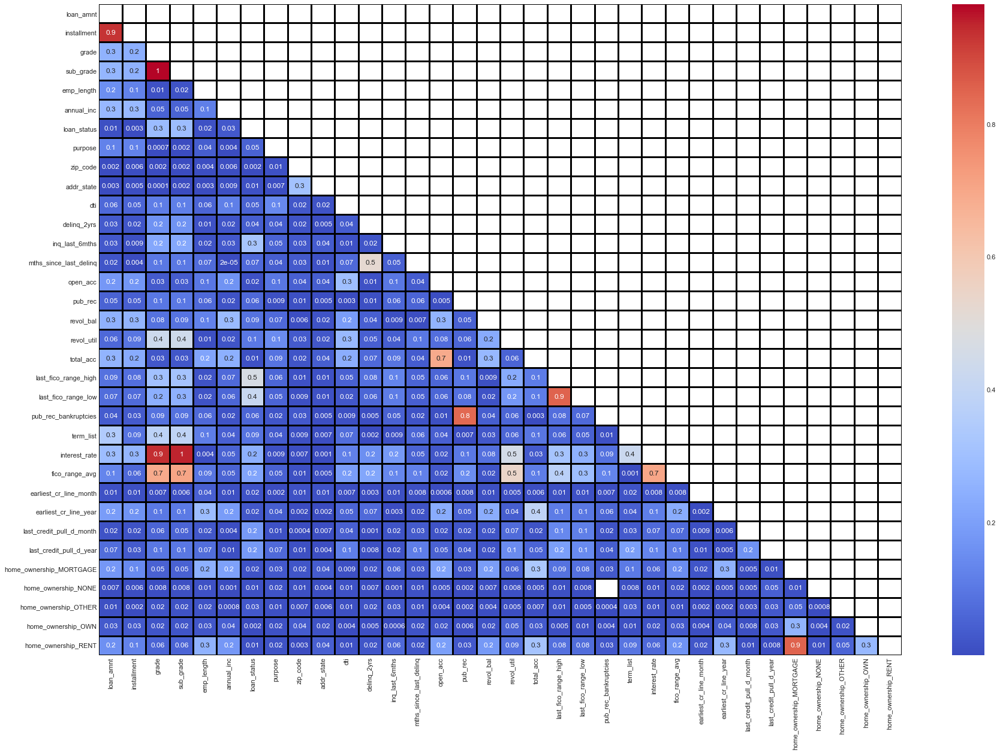

In [ ]:
# Correlation heatmap
plt.figure(figsize=(30,20))
cor=loan_df.corr().abs()
mask = np.triu(np.ones_like(cor, dtype=bool))
sns.heatmap(cor,mask=mask, annot=True, cmap='coolwarm',fmt='.1g' ,linewidths=2, linecolor='black',)

### **Handling of Missing Values:**

In [ ]:
loan_df.columns

Index(['loan_amnt', 'installment', 'grade', 'sub_grade', 'emp_length',
       'annual_inc', 'loan_status', 'purpose', 'zip_code', 'addr_state', 'dti',
       'delinq_2yrs', 'inq_last_6mths', 'mths_since_last_delinq', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'last_fico_range_high', 'last_fico_range_low', 'pub_rec_bankruptcies',
       'term_list', 'interest_rate', 'fico_range_avg',
       'earliest_cr_line_month', 'earliest_cr_line_year',
       'last_credit_pull_d_month', 'last_credit_pull_d_year',
       'home_ownership_MORTGAGE', 'home_ownership_NONE',
       'home_ownership_OTHER', 'home_ownership_OWN', 'home_ownership_RENT'],
      dtype='object')

In [ ]:
# Checking for missing values
miss_values=missing_values(loan_df)
miss_values.head()

Dataframe has 34 columns.
There are 10 columns that have missing values.


,Missing Values,% of Total Values
mths_since_last_delinq,26568,63.2
pub_rec_bankruptcies,1365,3.2
emp_length,1093,2.6
revol_util,90,0.2
delinq_2yrs,29,0.1


Missing values are common occurrences in data. Unfortunately, most predictive modeling techniques cannot handle any missing values. Therefore, this problem must be addressed prior to modeling.

In [ ]:
# Return the columns with null values greater than 0
null_valued_cols=loan_df.isna().sum()[loan_df.isna().sum()!=0].index.to_list()

In [ ]:
# Categorical null values
cat_null=[i for i in null_valued_cols if i in categorical_cols]
cat_null

['emp_length', 'revol_util']

<AxesSubplot:>

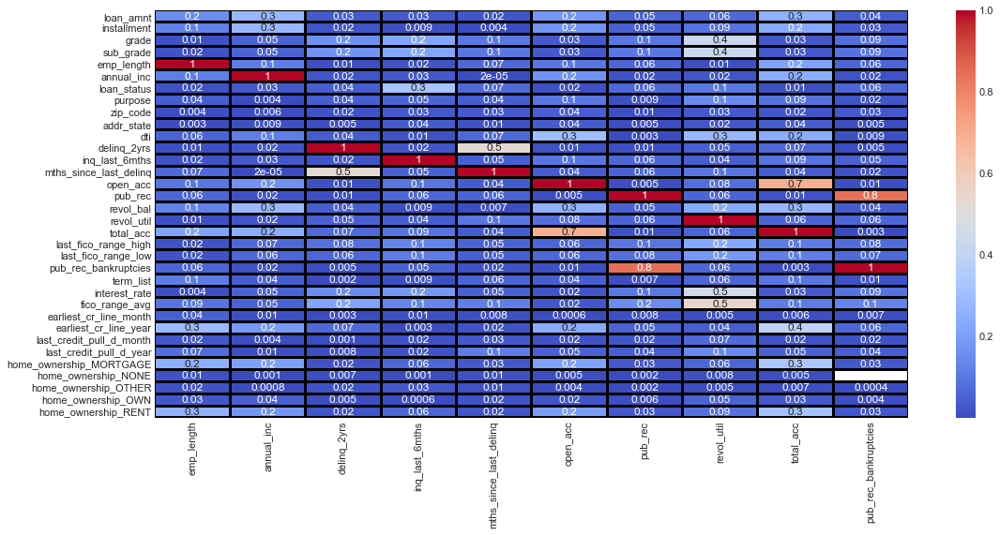

In [ ]:
# Chevking heatmap of nulled features
plt.figure(figsize=(18,8))
cor=loan_df.corr()[null_valued_cols].abs()

sns.heatmap(cor,annot=True, cmap='coolwarm',fmt='.1g' ,linewidths=2, linecolor='black',)

# **KNN Imputation of Missing values:**

In [ ]:
# defining X
X=loan_df.values

In [ ]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')

In [ ]:
X=loan_df.values
imputer.fit(X)

KNNImputer(n_neighbors=3)

In [ ]:
Xtrans = imputer.transform(X)

In [ ]:
# Updating our dataset loan_df
loan_df=pd.DataFrame(Xtrans,columns=loan_df.columns.to_list())

loan_df=pd.DataFrame(Xtrans,columns=loan_df.columns.to_list())
X=loan_df.drop(columns=['loan_status']).values
y=loan_df.loan_status

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X)

In [ ]:
# Renaming the principal components
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3'])
# Storing the loan status to y
principalDf['loan_status']=y

In [ ]:
# 3d scatterplot using plotly
import plotly.express as px
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z='principal component 3',
              color='loan_status',size_max=10, opacity=0.7)
# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

fig.show()
# model.labels_ is nothing but the predicted clusters i.e y_clusters

**Conclusion:** The distribution of datapoints in a three dimensional space using the three Principal Components as the axes

In [ ]:
# Just taking the round value for cat_null
loan_df[cat_null]=loan_df[cat_null].round()

# **Data Pre-Processing:**

In [ ]:
# Defining X and y
X=loan_df.drop(columns=['loan_status'])
y=loan_df.loan_status

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25, random_state=1)

In [ ]:
# Overall view of our datasets
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((31515, 33), (10506, 33), (31515,), (10506,))

### **Making of the Base-Line Model:**

In [ ]:
from sklearn import metrics
from sklearn.metrics import classification_report,recall_score,accuracy_score,precision_score,confusion_matrix

In [ ]:
def model_performance(model,x_train,x_test,y_train,y_test):
    model.fit(x_train,y_train)
    train_class_preds=model.predict(x_train)
    train_accuracy=model.score(x_train,y_train)
    precision_train=metrics.precision_score(y_train,train_class_preds)
    recall_train=metrics.recall_score(y_train,train_class_preds)
    f1_train=metrics.f1_score(y_train,train_class_preds)
    fp_train, tp_train, th_train = metrics.roc_curve(y_train,train_class_preds)
    auc_train=metrics.auc(fp_train, tp_train)
    classification_report_train=classification_report(y_train,train_class_preds)
    cm_train = confusion_matrix(y_train, train_class_preds)
    
    #For test dataset
    test_class_preds = model.predict(x_test)
    test_accuracy=model.score(x_test,y_test)
    precision_test=metrics.precision_score(y_test,test_class_preds)
    recall_test=metrics.recall_score(y_test,test_class_preds)
    f1_test=metrics.f1_score(y_test,test_class_preds)
    fp, tp, th = metrics.roc_curve(y_test, test_class_preds)
    auc_test=metrics.auc(fp, tp)
    classification_report_test=classification_report(y_test,test_class_preds)
    cm_test = confusion_matrix(y_test,test_class_preds)
    evaluation={'test_accuracy':test_accuracy,'recall_test':recall_test,'precision_test':precision_test,
                     'f1_test':f1_test,'auc_test':auc_test,"cm_test":cm_test,'train_accuracy':train_accuracy,
                     'precision_train':precision_train,'recall_train':recall_train,'f1_train':f1_train,
                    'auc_train':auc_train,'cm_train':cm_train}
    return evaluation

### **Feature Scaling using MinMaxScaler:**

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()

In [ ]:
loan_df.head(3)

,loan_amnt,installment,grade,sub_grade,emp_length,annual_inc,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,last_fico_range_high,last_fico_range_low,pub_rec_bankruptcies,term_list,interest_rate,fico_range_avg,earliest_cr_line_month,earliest_cr_line_year,last_credit_pull_d_month,last_credit_pull_d_year,home_ownership_MORTGAGE,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT
0,2500.0,59.83,2.0,13.0,1.0,30000.0,1.0,0.0,280.0,10.0,1.00,0.0,5.0,32.333333,3.0,0.0,1687.0,9.0,4.0,499.0,0.0,0.0,60.0,15.27,742.0,4.0,1999.0,9.0,2016.0,0.0,0.0,0.0,0.0,1.0
1,2400.0,84.33,2.0,14.0,10.0,12252.0,0.0,11.0,512.0,14.0,8.72,0.0,2.0,42.333333,2.0,0.0,2956.0,98.0,10.0,719.0,715.0,0.0,36.0,15.96,737.0,11.0,2001.0,9.0,2016.0,0.0,0.0,0.0,0.0,1.0
2,10000.0,339.31,2.0,10.0,10.0,49200.0,0.0,9.0,763.0,4.0,20.00,0.0,1.0,35.000000,10.0,0.0,5598.0,21.0,37.0,604.0,600.0,0.0,36.0,13.49,692.0,2.0,1996.0,4.0,2016.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
loan_scaled=loan_df.copy()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

### **Dealing with Class Imbalance using SMOTEENN:**

In [ ]:
from imblearn.combine import SMOTEENN
# using SMOTEENN 
sample = SMOTEENN(sampling_strategy=0.5,random_state=0)
# fitting to our actual X and y values
X_over, y_over = sample.fit_resample(X, y)

Text(0, 0.5, 'Counts')

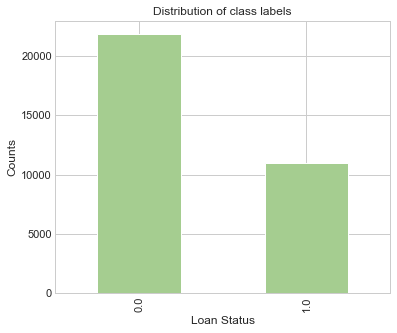

In [ ]:
# Checking the count of labels using a countplot after treating with SMOTEENN
plt.figure(figsize = (6,5))
y_over.value_counts().plot.bar(cmap='crest')
plt.title("Distribution of class labels")
plt.xlabel("Loan Status")
plt.ylabel("Counts")

<b> Conclusion:</b>
The class imbalance still persists, our model is not balanced, however the odds ratio in this case is close to 2:1, which is much lower than before.

# **Fitting Model with different ML algorithms**

In [ ]:
# Updating test_train splits
X_train,X_test,y_train,y_test=train_test_split(X_over,y_over,random_state=0,test_size=0.25,stratify=y_over)

In [ ]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()

logistic_reg=model_performance(lr,X_train,X_test, y_train,y_test)
log_df=pd.DataFrame.from_dict(logistic_reg, orient='index', columns=['Logistic Regression'])
log_df

,Logistic Regression
test_accuracy,0.903811
recall_test,0.839097
precision_test,0.868828
f1_test,0.853704
auc_test,0.887715
cm_test,"[[5118, 348], [442, 2305]]"
train_accuracy,0.90867
precision_train,0.876745
recall_train,0.845892
f1_train,0.861042


### XG Boost Classifier:

In [ ]:
# Hyperparameter tuning for XGB 
from sklearn.model_selection import RandomizedSearchCV
xgb= XGBClassifier(scale_pos_weight=90,objective = 'binary:logistic',
    nthread=4,
    eta = 0.1,
    max_depth = 9,
    subsample = 0.5,
    colsample_bytree = 1.0,
    silent = 1,
    )

parameters = {
    'n_estimators':[800,900,1000],
    'weights' :[ 99, 75, ],
    'eta': [0.05, 0.1, 0.3],
    'max_depth': [9, 11,13],
    'subsample': [0.9, 1.0],
    'colsample_bytree': [0.9, 1.0],
    'gamma':[0.2, 0.5, 1.0]
}

# define grid search
grid = RandomizedSearchCV(xgb, parameters, cv=2, scoring='roc_auc')

In [ ]:
XgbEval=grid.fit(X_train, y_train)

[12:16:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent", "weights" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:16:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:16:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent", "weights" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parame

In [ ]:
# Best parameters for XGB
best_prams=XgbEval.best_estimator_
best_prams

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9, eta=0.05, gamma=0.2,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0500000007, max_delta_step=0, max_depth=13,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=90,
              silent=1, subsample=0.9, tree_method='exact',
              validate_parameters=1, verbosity=None, weights=99)

In [ ]:
# Using the best params after Hyperparameter tuning
y_pred=best_prams.predict(X_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print(classification_report(y_test,y_pred))

[[5300  166]
 [  38 2709]]
Accuracy Score 0.9751613295994156
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      5466
         1.0       0.94      0.99      0.96      2747

    accuracy                           0.98      8213
   macro avg       0.97      0.98      0.97      8213
weighted avg       0.98      0.98      0.98      8213



**Conclusion:**
Our XGB is performing exceptionally well, it is giving us a precision of 94% and a recall of 99% on the test dataset

Text(0.5, 1.0, 'Confusion matrix')

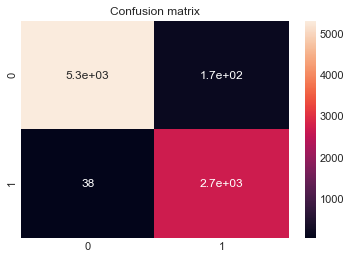

In [ ]:
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True)
plt.title("Confusion matrix")

# **Precision-Recall Curve:**

In [ ]:
from sklearn.metrics import precision_recall_curve
y_scores = best_prams.predict_proba(X_test)
y_scores = y_scores[:,1]

In [ ]:
precision, recall, threshold = precision_recall_curve(y_test, y_scores)

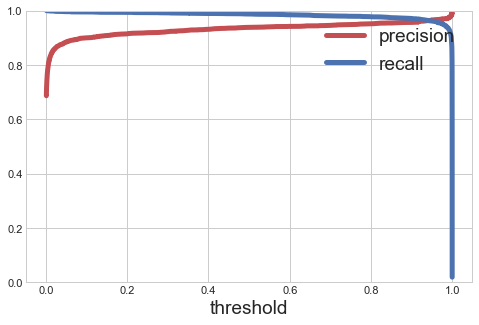

In [ ]:
def plot_precision_and_recall(precision, recall, threshold):
    plt.plot(threshold, precision[:-1], "r-", label="precision", linewidth=5)
    plt.plot(threshold, recall[:-1], "b", label="recall", linewidth=5)
    plt.xlabel("threshold", fontsize=19)
    plt.legend(loc="upper right", fontsize=19)
    plt.ylim([0, 1])
    
# Plotting our precision-recall curve of our model
plt.figure(figsize=(8, 5))
plot_precision_and_recall(precision, recall, threshold)
plt.show()

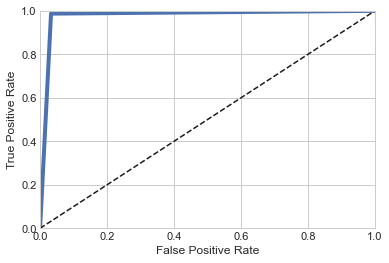

In [ ]:
from sklearn.metrics import roc_curve
fpr,tpr,thresholds=roc_curve(y_test,y_pred)

def plot_roc_curve(fpr,tpr,label=None):
    plt.plot(fpr,tpr,linewidth=4,label=label)
    plt.plot([0,1],[0,1],'k--')
    plt.axis([0,1,0,1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    
plot_roc_curve(fpr,tpr)
plt.show()

As we can see, XGBoost did a great job for getting high precision as well as a high recall.


For further enhancements to the model, feature engineering could be done. Also a broader term like 'good loan' and 'bad loan' could have been used by encompassing different loan statuses together to get a more balanced counts of classes rather than default/non-default.

We can see it penalize all defaulter and give us best Precision - Recall
compare to all three.

# **Model Interpretation using SHAP:**

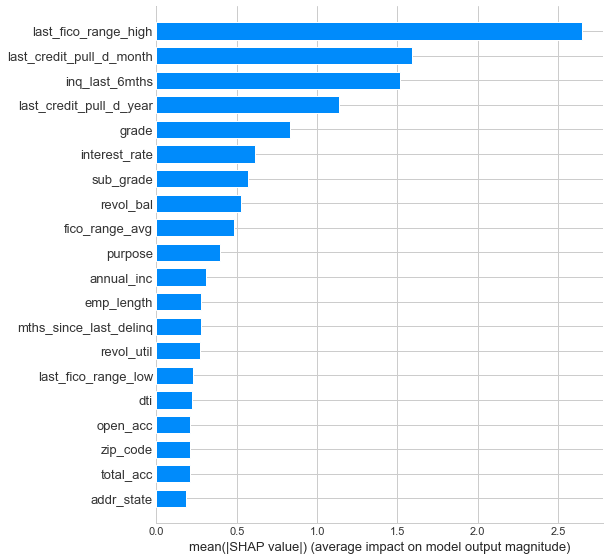

In [ ]:
import shap
shap_values = shap.TreeExplainer(best_prams).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

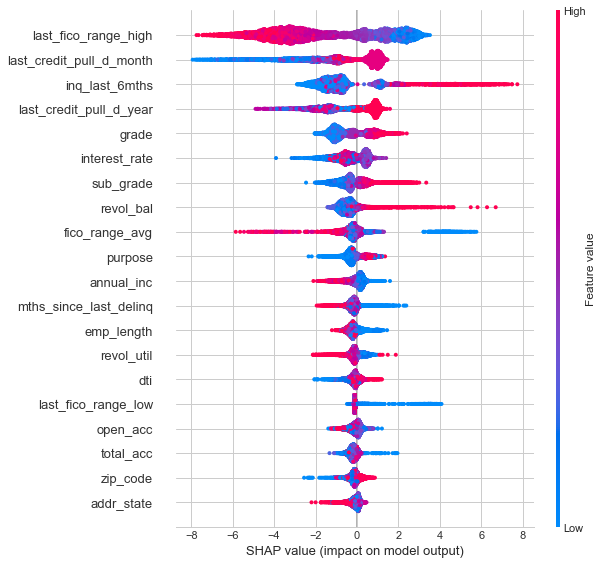

In [ ]:
import matplotlib.pyplot as plt
f = plt.figure()
xgb_shap_values = shap.TreeExplainer(best_prams).shap_values(X_test)
shap.summary_plot(xgb_shap_values, X_test)

### **Shap Force Plots for detailed interpretation:**

In [ ]:
# Get the predictions and put them with the test data.
## Calculate SHAP values for model
def shap_plots(row_number,X_test):
    explainer = shap.TreeExplainer(best_prams)
    shap_values = explainer.shap_values(X_test.iloc[[row_number]])

    # Feature names from dataframe
    names = X_test.columns
    values = X_test.iloc[[row_number]].values

    # visualization of results
    shap.initjs()

    return shap.force_plot(base_value=explainer.expected_value,
                          shap_values = shap_values,
                          features = X_test.iloc[[row_number]])


### **Displaying SHAP force plots for two records:**

In [ ]:
shap_plots(0,X_test)

In [ ]:
shap_plots(100,X_test)

In [ ]:
# Printing the mean of all features in our test dataset
X_test.mean()

loan_amnt                   0.300623
installment                 0.234266
grade                       0.273976
sub_grade                   0.302509
emp_length                  0.433880
annual_inc                  0.011072
purpose                     0.296162
zip_code                    0.514087
addr_state                  0.442837
dti                         0.438506
delinq_2yrs                 0.010521
inq_last_6mths              0.035189
mths_since_last_delinq      0.295469
open_acc                    0.178387
pub_rec                     0.010939
revol_bal                   0.011357
revol_util                  0.405732
total_acc                   0.232036
last_fico_range_high        0.804741
last_fico_range_low         0.788365
pub_rec_bankruptcies        0.021005
term_list                   0.246439
interest_rate               0.344990
fico_range_avg              0.484034
earliest_cr_line_month      0.537640
earliest_cr_line_year       0.819953
last_credit_pull_d_month    0.559918
l

## **Conclusion from SHAP plots:**

**Conclusion from the SHAP value (feature importance) plot:**
* The first plot gives us the feature importances corresponding to each feature. Our model says that 'last_fico_range_high' is the most important feature in our dataset followed by 'last_credit_pull_month'.
* 'addr_state' and 'account balance' are the features which are the least important.

**Conclusion from the SHAP value (impact) plot:**
* This plot shows the impact of each features in our model.
* The features are arranged in decreasing order of their feature importances.
* The red and blue color corresponds to higher and lower impact on the model output respectively
* For example, negative impact of lower_fico_range_high' and positive impact of 'inq_last_6_months' will lead to a person defaulting a loan.

**Conclusion from the SHAP force plot:**
* This is a detailed plot which gives us information of the features on several grounds.
* The color red impacts features moving the model to the class 1 level and vice-versa.
* We also have a base value which is simply the mean prediction
* The arrows represent the features pushing the model prediction to the higher(right) and lower(left) side
* We have also calculated the mean of each feature corresponding to the test set and the values of each feature in the force plot is compared to the mean value. If the **value in force plot < mean_value**, the prediction will be drove to the right and vice versa.

# **Conclusion**

The last_fico_range, grade, inq_last_6month  features were found to be the most relevant for predicting loan default in. The current model tries to predict default biased data from credit analysts grade and assigned interest rate. The XGBC models provide substantial improvements on traditional credit screening. A recall score significantly and robustly above 95%, and ROC scores also above 95%. The features provided to the model in our study generalize to any lending activity and institution, beyond P2P lending. The present work could, therefore, be augmented in order to predict loan default risk without the need for human credit screening.



Due to the time limit, it is not possible to conduct a thorough study and have a deep understanding of the dataset. There are still many features in the dataset that are unused and a lot of the information has not been fully digested with knowledge in the banking industry.


Only XGBoost algorithm is applied to our model, but there are many good ones out there even neural networks. The models can also be improved further by finer tunings on hyperparameters or using ensemble methods such as bagging, boosting,.

In the bank loan behaviour prediction, for example, banks want to control the loss to a acceptable level, so they may use a relatively low threshold. This means more customers will be grouped as “potential bad customers” and their profiles will be checked carefully later by the credit risk management team. In this way, banks can detect the default behaviours in the earlier stage and conduct the corresponding actions to reduce the possible loss.






